# 7.1.1

In [79]:
sigma = 10
beta = 8/3
rho = 28

import numpy as np
from scipy.integrate import solve_ivp

def lorenz(t, state):
    x, y, z = state
    dx_dt = sigma * (y - x)
    dy_dt = x * (rho - z) - y
    dz_dt = x * y - beta * z
    return [dx_dt, dy_dt, dz_dt]

T=500
t_span=(0,T)
t_eval=np.linspace(0,T,50000)
traj = solve_ivp(fun=lorenz, y0=(1,1,1), t_span=t_span, t_eval=t_eval).y

In [60]:
plot3d = line3d(traj.T, color='blue', thickness=1, camera_position=[54.2758,-64.1208,31.4535])
plot3d.show()

Graphics3d Object

In [58]:
plot3d = line3d(traj.T, color='blue', thickness=0.3)
plot3d.show(viewer='tachyon', camera_position=[54.2758,-64.1208,31.4535], zoom=20, figsize=100)

In [74]:
d = lambda x,y,z: x * y - beta * z
derivatives = []
for i in range(len(traj[0])):
    derivatives.append(d(traj[0,i],traj[1,i],traj[2,i]))

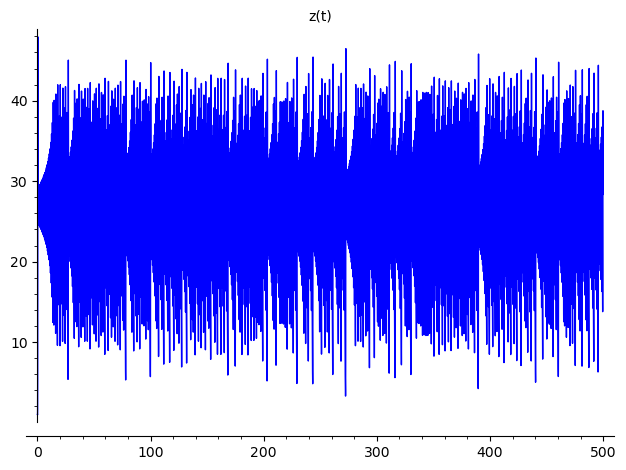

In [133]:
line(list(zip(t_eval, traj[2])), title='z(t)')

In [87]:
from scipy.signal import find_peaks

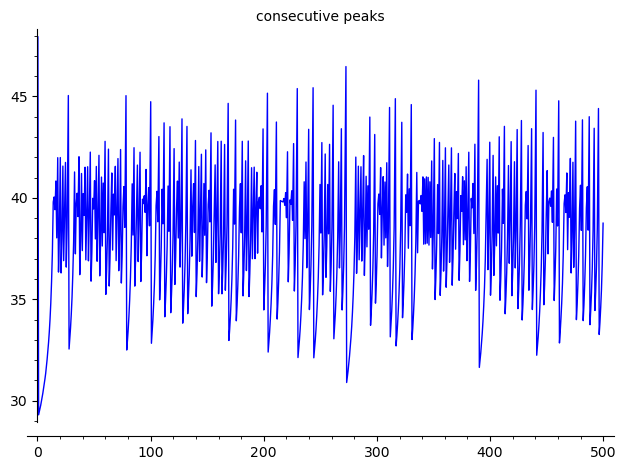

In [132]:
indices=find_peaks(traj[2])[0]
peaks=traj[2,indices]
line(list(zip(t_eval[indices], peaks)), title='consecutive peaks')

# 7.1.2

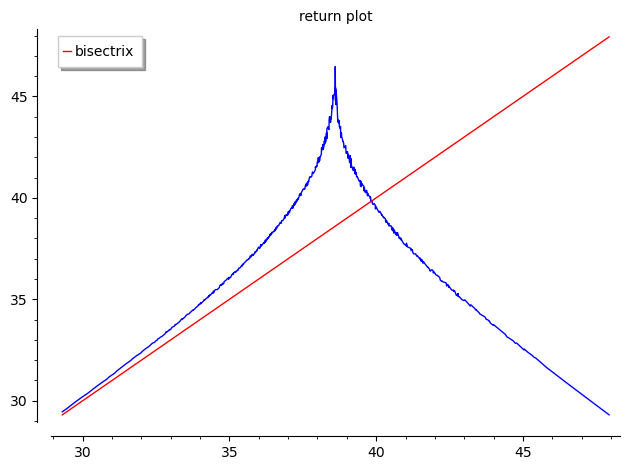

In [144]:
points = []
for j in range(len(peaks)-1):
    points.append((peaks[j], peaks[j+1]))
points.sort()
show(line(points, title='return plot')+line([[min(peaks)]*2,[max(peaks)]*2], legend_label='bisectrix', hue=0))

# 7.1.3

$$
\begin{gather}
z_{n+1} = F(z_n) \\
|F'(z_n)| > 1 \forall n \\
\varepsilon \in (0,1)
\end{gather}
$$
Let's take a look at the stability of k-th iterate of F:
$$
\begin{gather}
|(F^k)'(z_n)| = \prod_0^{k-1} F'(z_n+i) > 1
\end{gather}
$$
Thus for any point on any cycle, the distance between its trajectory and the trajectory of its perturbation is strictly increasing, meaning it's unstable.